<a href="https://colab.research.google.com/github/MahdiYousefiIRN/MahdiYousefiIRN/blob/main/NetLSTMByKeras.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

اضافه کردن کتابخانه ها به پروژه





https://github.com/saharrrzz/AE-LSTM-architecture-/blob/master/paper_code.ipynb

UCI :https://archive.ics.uci.edu/ml/datasets/individual+household+electric+power+consumption

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn.preprocessing
import tensorflow as tf
from numpy import nan
from numpy import isnan
from pandas import read_csv
from pandas import to_numeric
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import LSTM
from keras.layers import RepeatVector
from tensorflow import keras
import math
from keras.layers import Dropout
from sklearn.metrics import mean_absolute_error
from keras.layers import Bidirectional
from sklearn.metrics import mean_squared_error,r2_score,mean_absolute_error
from sklearn.preprocessing import MinMaxScaler
from google.colab import data_table
from vega_datasets import data


ایجاد اتصال به گوگل درایو

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


بارگذاری دیتا ست UCI

In [5]:
from zmq import NULL
df = read_csv('drive/MyDrive/Dataset/household_power_consumption.txt', sep=';', header=0, low_memory=False, infer_datetime_format=True, parse_dates={'datetime':[0,1]}, index_col=['datetime'])
df.replace('?', nan, inplace=True)
df = df.astype('float32')
data_table.enable_dataframe_formatter()
data_table.DataTable(df, include_index=False, num_rows_per_page=10)


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:24:00,4.216,0.418,234.839996,18.4,0.0,1.0,17.0
2006-12-16 17:25:00,5.360,0.436,233.630005,23.0,0.0,1.0,16.0
2006-12-16 17:26:00,5.374,0.498,233.289993,23.0,0.0,2.0,17.0
2006-12-16 17:27:00,5.388,0.502,233.740005,23.0,0.0,1.0,17.0
2006-12-16 17:28:00,3.666,0.528,235.679993,15.8,0.0,1.0,17.0
...,...,...,...,...,...,...,...
2010-11-26 20:58:00,0.946,0.000,240.429993,4.0,0.0,0.0,0.0
2010-11-26 20:59:00,0.944,0.000,240.000000,4.0,0.0,0.0,0.0
2010-11-26 21:00:00,0.938,0.000,239.820007,3.8,0.0,0.0,0.0


توضیحات

In [6]:
def fill_missing(values):
  one_day = 60 * 24
  for row in range(values.shape[0]):
    for col in range(values.shape[1]):
      if isnan(values[row, col]):
      	values[row, col] = (values[row - one_day, col])
      

In [9]:
fill_missing(df.values)
df[df['Global_active_power'].isnull()]
df['Global_active_power']
# data_table.DataTable(df[df['Global_active_power'].isnull()]  , include_index=False, num_rows_per_page=10)
 

datetime
2006-12-16 17:24:00    4.216
2006-12-16 17:25:00    5.360
2006-12-16 17:26:00    5.374
2006-12-16 17:27:00    5.388
2006-12-16 17:28:00    3.666
                       ...  
2010-11-26 20:58:00    0.946
2010-11-26 20:59:00    0.944
2010-11-26 21:00:00    0.938
2010-11-26 21:01:00    0.934
2010-11-26 21:02:00    0.932
Name: Global_active_power, Length: 2075259, dtype: float32

Daily Data

In [12]:
daily_groups = df.resample('T')
daily_dataTime = daily_groups.sum()
daily_dataTime.Global_active_power


datetime
2006-12-16 17:24:00    4.216
2006-12-16 17:25:00    5.360
2006-12-16 17:26:00    5.374
2006-12-16 17:27:00    5.388
2006-12-16 17:28:00    3.666
                       ...  
2010-11-26 20:58:00    0.946
2010-11-26 20:59:00    0.944
2010-11-26 21:00:00    0.938
2010-11-26 21:01:00    0.934
2010-11-26 21:02:00    0.932
Freq: T, Name: Global_active_power, Length: 2075259, dtype: float32

In [8]:
daily_groups = df.resample('D')
daily_data = daily_groups.sum()
daily_data


,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16,1209.176025,34.922001,93552.53125,5180.799805,0.0,546.0,4926.0
2006-12-17,3390.459961,226.005997,345725.31250,14398.599609,2033.0,4187.0,13341.0
2006-12-18,2203.825928,161.792007,347373.62500,9247.200195,1063.0,2621.0,14018.0
2006-12-19,1666.193970,150.942001,348479.00000,7094.000000,839.0,7602.0,6197.0
2006-12-20,2225.748047,160.998001,348923.62500,9313.000000,0.0,2648.0,14063.0
...,...,...,...,...,...,...,...
2010-11-22,2041.536011,142.354004,345883.84375,8660.400391,4855.0,2110.0,10136.0
2010-11-23,1577.536011,137.449997,346428.75000,6731.200195,1871.0,458.0,7611.0
2010-11-24,1796.248047,132.460007,345644.59375,7559.399902,1096.0,2848.0,12224.0


نمودار  مصرف برق مشترکین  به صورت روزانه

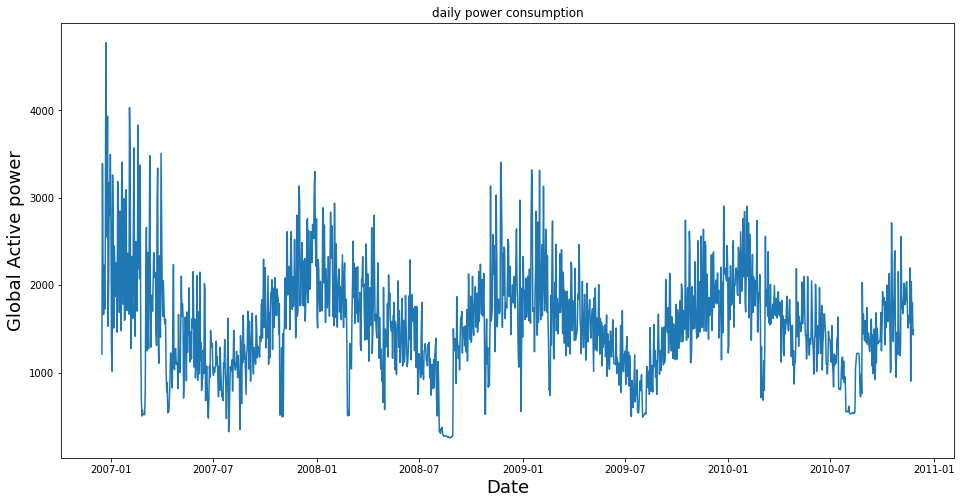

In [13]:
plt.figure(figsize=(16,8))
plt.title("daily power consumption")
plt.plot(daily_data['Global_active_power'])
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.show()

نمایش داده ها به صورت ساعتی 

In [ ]:
Hourly_groups = df.resample('H')
Hourly_data = Hourly_groups.sum()
Hourly_data

,Global_active_power,Global_reactive_power,Voltage,Global_intensity,Sub_metering_1,Sub_metering_2,Sub_metering_3
datetime,,,,,,,
2006-12-16 17:00:00,152.024002,8.243999,8447.179688,651.599976,0.0,19.0,607.0
2006-12-16 18:00:00,217.932007,4.802000,14074.809570,936.000000,0.0,403.0,1012.0
2006-12-16 19:00:00,204.013992,5.114000,13993.950195,870.200012,0.0,86.0,1001.0
2006-12-16 20:00:00,196.113998,4.506000,14044.290039,835.000000,0.0,0.0,1007.0
2006-12-16 21:00:00,183.388000,4.600000,14229.519531,782.799988,0.0,25.0,1033.0
...,...,...,...,...,...,...,...
2010-11-26 17:00:00,103.554001,3.684000,14224.179688,433.000000,0.0,0.0,772.0
2010-11-26 18:00:00,94.407997,3.222000,14251.910156,397.200012,0.0,0.0,0.0
2010-11-26 19:00:00,99.559998,3.602000,14204.459961,423.399994,0.0,4.0,0.0


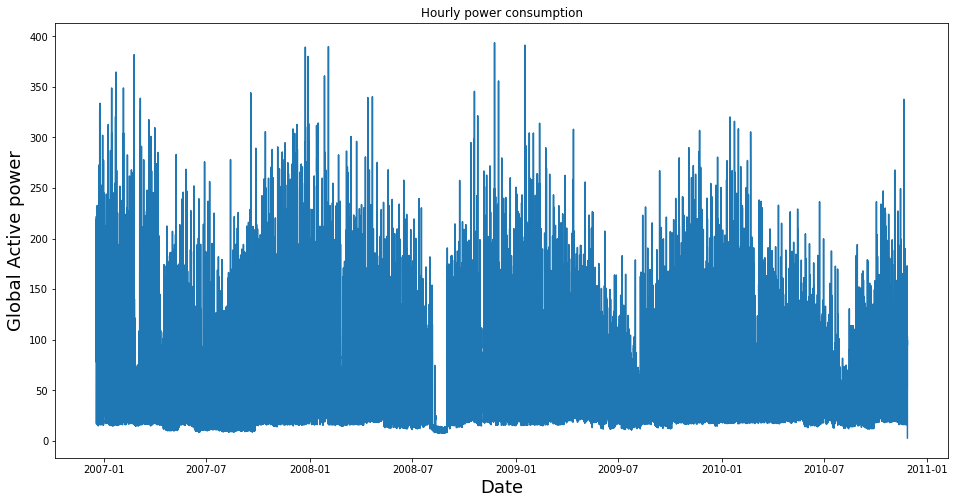

In [ ]:
plt.figure(figsize=(16,8))
plt.title("Hourly power consumption")
plt.plot(Hourly_data['Global_active_power'])
plt.xlabel('Date',fontsize = 18 )
plt.ylabel('Global Active power',fontsize = 18 )
plt.show()

جدا کردن داده های تست و روزانه

In [14]:
train_size = int(len(daily_data) * 0.80)
test_size = len(daily_data) - train_size
train, test = daily_data.iloc[0:train_size], daily_data.iloc[train_size:len(daily_data)]
print("train : ",len(train)," -------  test : " ,len(test))

print("*******************************")
print( train)
print("*******************************")
print( test)
print("*******************************")








train :  1153  -------  test :  289
*******************************
            Global_active_power  Global_reactive_power       Voltage  \
datetime                                                               
2006-12-16          1209.176025              34.922001   93552.53125   
2006-12-17          3390.459961             226.005997  345725.31250   
2006-12-18          2203.825928             161.792007  347373.62500   
2006-12-19          1666.193970             150.942001  348479.00000   
2006-12-20          2225.748047             160.998001  348923.62500   
...                         ...                    ...           ...   
2010-02-06          2712.986084             296.614014  347172.59375   
2010-02-07          1625.708008             162.466003  349465.62500   
2010-02-08          2582.238037             139.750000  348475.37500   
2010-02-09          2420.931885             139.712006  350136.53125   
2010-02-10          1946.878052             141.621994  349124.37500

train , test

In [15]:
from sklearn.preprocessing import MinMaxScaler
f_columns = ['Global_reactive_power',	'Voltage',	'Global_intensity',	'Sub_metering_1',	'Sub_metering_2',	'Sub_metering_3']
f_transformer = MinMaxScaler()
f_transformer = f_transformer.fit(train[f_columns].to_numpy())
print(f_transformer)

MinMaxScaler()


In [16]:
train.loc[:, f_columns] = f_transformer.transform(train[f_columns].to_numpy())
test.loc[:, f_columns]   = f_transformer.transform(test[f_columns].to_numpy())

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a

In [17]:
cnt_transformer = MinMaxScaler()
cnt_transformer = cnt_transformer.fit(train[['Global_active_power']])
train['Global_active_power'] = cnt_transformer.transform(train[['Global_active_power']])
test['Global_active_power'] = cnt_transformer.transform(test[['Global_active_power']])

<ipython-input-17-b2481ad3175a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['Global_active_power'] = cnt_transformer.transform(train[['Global_active_power']])
<ipython-input-17-b2481ad3175a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['Global_active_power'] = cnt_transformer.transform(test[['Global_active_power']])


create Dataset

In [18]:
def create_dataset(X, y, time_steps=1):
    Xs, ys = [], []
    for i in range(len(X) - time_steps):
        v = X.iloc[i:(i + time_steps),1:].values
        Xs.append(v)
        ys.append(y.iloc[i + time_steps:i + time_steps+1])
    return np.array(Xs), np.array(ys)

In [19]:

def create_features(df, label=None):
    """
    Creates time series features from datetime index.
    """
    df = df.copy()
    df['date'] = df.index
    print(df['date'])
    df['hour'] = df['date'].dt.hour
    df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    
    X = df[['hour','dayofweek','quarter','month','year',
           'dayofyear','dayofmonth','weekofyear']]

  



description

In [20]:
time_steps = 7
# reshape to [samples, time_steps, n_features]
X_train, y_train = create_dataset(train, train.Global_active_power, time_steps)
X_test, y_test = create_dataset(test, test.Global_active_power, time_steps)
print("**********************************************************")
print("X_train = ",X_train.shape," --------- y_train = ", y_train.shape)

print("**********************************************************")
print("X_test =",X_test.shape," ---------  y_test = ", y_test.shape)
print("**********************************************************")
print(X_train)

**********************************************************
X_train =  (1146, 7, 6)  --------- y_train =  (1146, 1)
**********************************************************
X_test = (282, 7, 6)  ---------  y_test =  (282, 1)
**********************************************************
[[[0.         0.         0.21100625 0.         0.04509043 0.1620129 ]
  [0.49902847 0.9597301  0.69522595 0.18187511 0.34577587 0.5367624 ]
  [0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]
  ...
  [0.3292558  0.9719023  0.42807463 0.         0.21868032 0.5689156 ]
  [0.28599784 0.96494824 0.3205648  0.15789944 0.22231399 0.40828323]
  [0.39691624 0.9657449  0.4587527  0.28189301 0.02890412 0.43834335]]

 [[0.49902847 0.9597301  0.69522595 0.18187511 0.34577587 0.5367624 ]
  [0.33132938 0.96600324 0.4246181  0.09509751 0.21645057 0.5669116 ]
  [0.3029939  0.97021013 0.31150848 0.07505815 0.6277975  0.218615  ]
  ...
  [0.28599784 0.96494824 0.3205648  0.15789944 0.22231399 0.40828323]
 

مدل ارایه شده

In [21]:
model = Sequential()
model.add(LSTM(128, activation='relu', return_sequences=True))
model.add(LSTM(64, activation='relu', return_sequences=False))
model.add(RepeatVector(7))
model.add(LSTM(64, activation='relu', return_sequences=True))
model.add(LSTM(128, activation='relu', return_sequences=True))

model.add(Bidirectional(LSTM(128, activation='relu',return_sequences=True)))
model.add(LSTM(64, activation='relu', return_sequences=True))
# model.add(LSTM(64, activation='relu', return_sequences=True))
model.add(Dropout(0.25))
model.add(LSTM(64, activation='relu', return_sequences=False))
# model.add(LSTM(32, activation='relu', return_sequences=False))
model.add(Dropout(0.25))
# model.add(Flatten())
model.add(Dense(10,activation='relu'))
model.add(Dense(1,activation='relu'))
# opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(loss='mse', optimizer='adam')
model.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data                         # e.g. input_shape = (None, 32, 32, 3)
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 7, 128)            69120     
                                                                 
 lstm_1 (LSTM)               (None, 64)                49408     
                                                                 
 repeat_vector (RepeatVector  (None, 7, 64)            0         
 )                                                               
                                                                 
 lstm_2 (LSTM)               (None, 7, 64)             33024     
                                                                 
 lstm_3 (LSTM)               (None, 7, 128)            98816     
                                                                 
 bidirectional (Bidirectiona  (None, 7, 256)           263168    
 l)                                                     

In [22]:
history = model.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)

Epoch 1/100
7/7 [==============================] - 15s 555ms/step - loss: 0.0895 - val_loss: 0.0290
Epoch 2/100
7/7 [==============================] - 1s 176ms/step - loss: 0.0328 - val_loss: 0.0151
Epoch 3/100
7/7 [==============================] - 1s 181ms/step - loss: 0.0240 - val_loss: 0.0131
Epoch 4/100
7/7 [==============================] - 1s 177ms/step - loss: 0.0238 - val_loss: 0.0122
Epoch 5/100
7/7 [==============================] - 1s 176ms/step - loss: 0.0224 - val_loss: 0.0132
Epoch 6/100
7/7 [==============================] - 1s 185ms/step - loss: 0.0229 - val_loss: 0.0124
Epoch 7/100
7/7 [==============================] - 1s 173ms/step - loss: 0.0226 - val_loss: 0.0118
Epoch 8/100
7/7 [==============================] - 2s 205ms/step - loss: 0.0217 - val_loss: 0.0111
Epoch 9/100
7/7 [==============================] - 1s 179ms/step - loss: 0.0206 - val_loss: 0.0089
Epoch 10/100
7/7 [==============================] - 2s 194ms/step - loss: 0.0172 - val_loss: 0.0066
Epoch 11

 losعملکرد تابع  
 

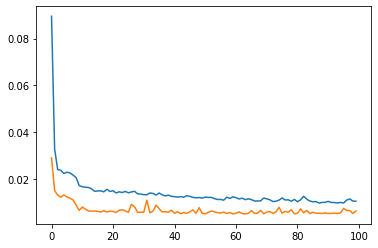

In [23]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.show()

In [24]:
y_pred = model.predict(X_test)

y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))

print(y_test_inv.shape)
print(y_pred_inv.shape)

testScore = math.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
#MAPE=mean_absolute_percentage_error(y_true,y_pred)
MAE =mean_absolute_error(y_test_inv, y_pred_inv)

print('Test Score: %.2f RMSE' % (testScore))
#print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))
     

9/9 [==============================] - 1s 24ms/step
(1, 282)
(1, 282)
Test Score: 364.78 RMSE
Test Score: 264.29 MAE


In [25]:
import tensorflow as tf
from keras.layers import GRU, Embedding, Bidirectional

embedding_dim = 32

modelGRU = keras.Sequential()
modelGRU.add(GRU(128, activation='relu', return_sequences=True))
modelGRU.add(GRU(64, activation='relu', return_sequences=False))
modelGRU.add(RepeatVector(7))
modelGRU.add(GRU(64, activation='relu', return_sequences=True))
modelGRU.add(GRU(128, activation='relu', return_sequences=True))
modelGRU.add(Bidirectional(LSTM(128, activation='relu',return_sequences=True)))
modelGRU.add(GRU(64, activation='relu', return_sequences=True))
# model.add(LSTM(64, activation='relu', return_sequences=True))
modelGRU.add(Dropout(0.25))
modelGRU.add(GRU(64, activation='relu', return_sequences=False))
# model.add(LSTM(32, activation='relu', return_sequences=False))
modelGRU.add(Dropout(0.25))
# model.add(Flatten())
modelGRU.add(Dense(10,activation='relu'))
modelGRU.add(Dense(1,activation='relu'))
# opt = keras.optimizers.Adam(learning_rate=0.001)
modelGRU.build(input_shape=(None,X_train.shape[1],X_train.shape[2])) # `input_shape` is the shape of the input data                         # e.g. input_shape = (None, 32, 32, 3)
modelGRU.compile(loss='mse', optimizer='adam')
modelGRU.summary()


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 7, 128)            52224     
                                                                 
 gru_1 (GRU)                 (None, 64)                37248     
                                                                 
 repeat_vector_1 (RepeatVect  (None, 7, 64)            0         
 or)                                                             
                                                                 
 gru_2 (GRU)                 (None, 7, 64)             24960     
                                                                 
 gru_3 (GRU)                 (None, 7, 128)            74496     
                                                                 
 bidirectional_1 (Bidirectio  (None, 7, 256)           263168    
 nal)                                                 

In [ ]:
history = modelGRU.fit(X_train, y_train, epochs=100, batch_size=128, validation_split=0.3)

Epoch 1/100
7/7 [==============================] - 20s 623ms/step - loss: 0.0783 - val_loss: 0.0144
Epoch 2/100
7/7 [==============================] - 2s 236ms/step - loss: 0.0288 - val_loss: 0.0131
Epoch 3/100
7/7 [==============================] - 2s 257ms/step - loss: 0.0256 - val_loss: 0.0117
Epoch 4/100
7/7 [==============================] - 2s 196ms/step - loss: 0.0230 - val_loss: 0.0127
Epoch 5/100
7/7 [==============================] - 2s 238ms/step - loss: 0.0219 - val_loss: 0.0109
Epoch 6/100
7/7 [==============================] - 2s 222ms/step - loss: 0.0214 - val_loss: 0.0104
Epoch 7/100
7/7 [==============================] - 1s 185ms/step - loss: 0.0193 - val_loss: 0.0082
Epoch 8/100
7/7 [==============================] - 1s 166ms/step - loss: 0.0177 - val_loss: 0.0067
Epoch 9/100
7/7 [==============================] - 3s 484ms/step - loss: 0.0162 - val_loss: 0.0060
Epoch 10/100
7/7 [==============================] - 2s 216ms/step - loss: 0.0153 - val_loss: 0.0072
Epoch 11

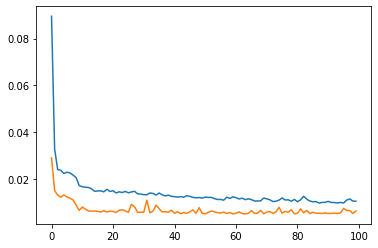

In [26]:
plt.plot(history.history['loss'] , label='train')
plt.plot(history.history['val_loss'], label='validation')
plt.show()

In [27]:
y_pred = modelGRU.predict(X_test)

y_train_inv = cnt_transformer.inverse_transform(y_train.reshape(1,-1))
y_test_inv = cnt_transformer.inverse_transform(y_test.reshape(1,-1))
y_pred_inv = cnt_transformer.inverse_transform(y_pred.reshape(1,-1))

print(y_test_inv.shape)
print(y_pred_inv.shape)

testScore = math.sqrt(mean_squared_error(y_test_inv, y_pred_inv))
#MAPE=mean_absolute_percentage_error(y_true,y_pred)
MAE =mean_absolute_error(y_test_inv, y_pred_inv)

print('Test Score: %.2f RMSE' % (testScore))
#print('Test Score: %.2f MAPE' % (MAPE))
print('Test Score: %.2f MAE' % (MAE))
     

9/9 [==============================] - 1s 17ms/step
(1, 282)
(1, 282)
Test Score: 1255.39 RMSE
Test Score: 1179.71 MAE
